In [27]:
import os
import xarray as xr
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import cartopy.crs as ccrs # => to add in Seastar env

from scipy import interpolate, stats # => to add in Seastar env ?


In [2]:
def computeL1b(ds, window=3): # window 5x5 to 7x7
#     ds['SigmaSLCMaster'] = ds.SigmaImageSingleLookRealPart  + 1j * ds.SigmaImageSingleLookImaginaryPart
    ds['SigmaSLCMaster'] = ( ds.SigmaImageSingleLookRealPart  + 1j * ds.SigmaImageSingleLookImaginaryPart )

    ds['SigmaImageAmplitude'] = np.abs( ds.SigmaSLCMaster )
    if 'SigmaImageSingleLookRealPartSlave' in ds.data_vars:
#         ds['SigmaSLCSlave'] = ds.SigmaImageSingleLookRealPartSlave  + 1j * ds.SigmaImageSingleLookImaginaryPartSlave
        ds['SigmaSLCSlave'] = ( ds.SigmaImageSingleLookRealPartSlave  + 1j * ds.SigmaImageSingleLookImaginaryPartSlave )
        ds['I_avg'] = ( ds.SigmaSLCMaster * np.conjugate(ds.SigmaSLCSlave) ).rolling(GroundRange=window).mean().rolling(CrossRange=window).mean()
        ds['interferogram'] = (
            ['CrossRange', 'GroundRange'],
            np.angle( ds.I_avg, deg=True )
        )
        ds['master_avg'] = ( np.abs(ds.SigmaSLCMaster)**2 ).rolling(GroundRange=window).mean().rolling(CrossRange=window).mean()
        ds['slave_avg'] = ( np.abs(ds.SigmaSLCSlave)**2 ).rolling(GroundRange=window).mean().rolling(CrossRange=window).mean()
        ds['coherence'] = np.abs( ds.I_avg )\
            / np.sqrt( ds['master_avg'] * ds['slave_avg'])
    return ds

In [3]:
dirIn = "~/OneDrive/OneDrive - NOC/Documents/NOC-OneDrive/workLocal/SEASTAR/DATA/OSCAR/v0/Brest_Sample_June_28_2022/"


In [4]:
dsm = xr.open_dataset(dirIn + 'SAR_CPLX_20220517T093239_13.5G_VV_00_pres_1_fdc_auto.sar.nc',
                     mask_and_scale=True)
dsm = computeL1b( dsm )

In [5]:
dsf = xr.open_dataset(
    dirIn 
  + 'SAR_CPLX_20220517T093239_13.5G_VV_33_pres_1_fdc_auto.sar_INF_SAR_CPLX_20220517T093239_13.5G_VV_34_pres_1_fdc_auto.sar.nc'
)
dsf = computeL1b( dsf, window=7 )

/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [6]:
dsa = xr.open_dataset(
    dirIn 
    + 'SAR_CPLX_20220517T093239_13.5G_VV_77_pres_1_fdc_auto.sar_INF_SAR_CPLX_20220517T093239_13.5G_VV_78_pres_1_fdc_auto.sar.nc'
)
dsa = computeL1b( dsa, window=7 )

In [7]:
dsm

<xarray.Dataset>
Dimensions:                            (AntPatternAngles: 361, CrossRange: 2079, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 371, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                        (GroundRange) float32 1424.0 ... 4384.0
  * CrossRange                         (CrossRange) float32 -8248.0 ... 8376.0
  * GPSTime                            (GPSTime) float64 2.072e+05 ... 2.073e+05
  * AntPatternAngles                   (AntPatternAngles) float64 nan ... nan
  * GBPGridInfo                        (GBPGridInfo) float64 3.447e+05 ... -0...
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart       (CrossRange, GroundRange) float64 ...
    SigmaImageSingleLookImaginaryPart  (CrossRange, GroundRange) float64 0.0 ...
    LatImage                           (CrossRange, GroundRange) float64 ...
    LonImage                           (CrossRange, GroundRange) float64 ...
    DEMImage                           (CrossRange, GroundRange) float32 ...
    OrbLatImage                        (CrossRange, GroundRange) float64 ...
    OrbLonImage                        (CrossRange, GroundRange) float64 ...
    OrbHeightImage                     (CrossRange, GroundRange) float64 ...
    OrbTimeImage                       (CrossRange, GroundRange) float64 ...
    OrbitImage                         (CrossRange, GroundRange) float32 ...
    OrbitLatitude                      (GPSTime) float64 ...
    OrbitLongitude                     (GPSTime) float64 ...
    OrbitHeight                        (GPSTime) float64 ...
    OrbitHeading                       (GPSTime) float64 ...
    OrbitRoll                          (GPSTime) float64 ...
    OrbitPitch                         (GPSTime) float64 ...
    TxElevationGain                    (AntPatternAngles) float64 ...
    TxAzimuthGain                      (AntPatternAngles) float64 ...
    RxElevationGain                    (AntPatternAngles) float64 ...
    RxAzimuthGain                      (AntPatternAngles) float64 ...
    ModelTransformationTag             (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                          int32 ...
    StartMonth                         int32 ...
    StartDay                           int32 ...
    StartHour                          int32 ...
    StartMin                           int32 ...
    StartSec                           float32 ...
    FinalYear                          int32 ...
    FinalMonth                         int32 ...
    FinalDay                           int32 ...
    FinalHour                          int32 ...
    FinalMin                           int32 ...
    FinalSec                           float32 ...
    TxPolarization                     |S1 ...
    RxPolarization                     |S1 ...
    LookDirection                      |S1 ...
    TxPointEl                          float32 ...
    TxPointAz                          float32 ...
    RxPointEl                          float32 ...
    RxPointAz                          float32 ...
    CentralFreq                        float32 ...
    TransmittedBandWidth               float32 ...
    MeanForwardVelocity                float32 ...
    PRF                                float32 ...
    DopplerPresumming                  float32 ...
    WindowFunction                     float32 ...
    MinProcessedDoppler                float32 ...
    MaxProcessedDoppler                float32 ...
    Latitude11                         float64 ...
    Longitude11                        float64 ...
    Latitude12                         float64 ...
    Longitude12                        float64 ...
    Latitude21                         float64 ...
    Longitude21                        float64 ...
    Latitude22                         float64 ...
    Longitude22                        float

In [8]:
dsa

<xarray.Dataset>
Dimensions:                                 (AntPatternAngles: 361, CrossRange: 2080, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 371, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                             (GroundRange) float32 1424.0 ... ...
  * CrossRange                              (CrossRange) float32 -11360.0 ......
  * GPSTime                                 (GPSTime) float64 2.072e+05 ... 2...
  * AntPatternAngles                        (AntPatternAngles) float64 nan .....
  * GBPGridInfo                             (GBPGridInfo) float64 3.447e+05 ....
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart            (CrossRange, GroundRange) float64 ...
    SigmaImageSingleLookImaginaryPart       (CrossRange, GroundRange) float64 ...
    LatImage                                (CrossRange, GroundRange) float64 ...
    LonImage                                (CrossRange, GroundRange) float64 ...
    DEMImage                                (CrossRange, GroundRange) float32 ...
    OrbLatImage                             (CrossRange, GroundRange) float64 ...
    OrbLonImage                             (CrossRange, GroundRange) float64 ...
    OrbHeightImage                          (CrossRange, GroundRange) float64 ...
    OrbTimeImage                            (CrossRange, GroundRange) float64 ...
    OrbitImage                              (CrossRange, GroundRange) float32 ...
    OrbitLatitude                           (GPSTime) float64 ...
    OrbitLongitude                          (GPSTime) float64 ...
    OrbitHeight                             (GPSTime) float64 ...
    OrbitHeading                            (GPSTime) float64 ...
    OrbitRoll                               (GPSTime) float64 ...
    OrbitPitch                              (GPSTime) float64 ...
    TxElevationGain                         (AntPatternAngles) float64 ...
    TxAzimuthGain                           (AntPatternAngles) float64 ...
    RxElevationGain                         (AntPatternAngles) float64 ...
    RxAzimuthGain                           (AntPatternAngles) float64 ...
    ModelTransformationTag                  (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                               int32 ...
    StartMonth                              int32 ...
    StartDay                                int32 ...
    StartHour                               int32 ...
    StartMin                                int32 ...
    StartSec                                float32 ...
    FinalYear                               int32 ...
    FinalMonth                              int32 ...
    FinalDay                                int32 ...
    FinalHour                               int32 ...
    FinalMin                                int32 ...
    FinalSec                                float32 ...
    TxPolarization                          |S1 ...
    RxPolarization                          |S1 ...
    LookDirection                           |S1 ...
    TxPointEl                               float32 ...
    TxPointAz                               float32 ...
    RxPointEl                               float32 ...
    RxPointAz                               float32 ...
    CentralFreq                             float32 ...
    TransmittedBandWidth                    float32 ...
    MeanForwardVelocity                     float32 ...
    PRF                                     float32 ...
    DopplerPresumming                       float32 ...
    WindowFunction                          float32 ...
    MinProcessedDoppler                     float32 ...
    MaxProcessedDoppler                     float32 ...
    Latitude11                              float64 ...
    Longitude11                             float64 ...
    Latitude12                           

In [9]:
dsf

<xarray.Dataset>
Dimensions:                                 (AntPatternAngles: 361, CrossRange: 2079, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 371, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                             (GroundRange) float32 1424.0 ... ...
  * CrossRange                              (CrossRange) float32 -7240.0 ... ...
  * GPSTime                                 (GPSTime) float64 2.072e+05 ... 2...
  * AntPatternAngles                        (AntPatternAngles) float64 nan .....
  * GBPGridInfo                             (GBPGridInfo) float64 3.447e+05 ....
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart            (CrossRange, GroundRange) float64 ...
    SigmaImageSingleLookImaginaryPart       (CrossRange, GroundRange) float64 ...
    LatImage                                (CrossRange, GroundRange) float64 ...
    LonImage                                (CrossRange, GroundRange) float64 ...
    DEMImage                                (CrossRange, GroundRange) float32 ...
    OrbLatImage                             (CrossRange, GroundRange) float64 ...
    OrbLonImage                             (CrossRange, GroundRange) float64 ...
    OrbHeightImage                          (CrossRange, GroundRange) float64 ...
    OrbTimeImage                            (CrossRange, GroundRange) float64 ...
    OrbitImage                              (CrossRange, GroundRange) float32 ...
    OrbitLatitude                           (GPSTime) float64 ...
    OrbitLongitude                          (GPSTime) float64 ...
    OrbitHeight                             (GPSTime) float64 ...
    OrbitHeading                            (GPSTime) float64 ...
    OrbitRoll                               (GPSTime) float64 ...
    OrbitPitch                              (GPSTime) float64 ...
    TxElevationGain                         (AntPatternAngles) float64 ...
    TxAzimuthGain                           (AntPatternAngles) float64 ...
    RxElevationGain                         (AntPatternAngles) float64 ...
    RxAzimuthGain                           (AntPatternAngles) float64 ...
    ModelTransformationTag                  (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                               int32 ...
    StartMonth                              int32 ...
    StartDay                                int32 ...
    StartHour                               int32 ...
    StartMin                                int32 ...
    StartSec                                float32 ...
    FinalYear                               int32 ...
    FinalMonth                              int32 ...
    FinalDay                                int32 ...
    FinalHour                               int32 ...
    FinalMin                                int32 ...
    FinalSec                                float32 ...
    TxPolarization                          |S1 ...
    RxPolarization                          |S1 ...
    LookDirection                           |S1 ...
    TxPointEl                               float32 ...
    TxPointAz                               float32 ...
    RxPointEl                               float32 ...
    RxPointAz                               float32 ...
    CentralFreq                             float32 ...
    TransmittedBandWidth                    float32 ...
    MeanForwardVelocity                     float32 ...
    PRF                                     float32 ...
    DopplerPresumming                       float32 ...
    WindowFunction                          float32 ...
    MinProcessedDoppler                     float32 ...
    MaxProcessedDoppler                     float32 ...
    Latitude11                              float64 ...
    Longitude11                             float64 ...
    Latitude12                           

In [10]:
# ds['SigmaSLCMaster'] = ds.SigmaImageSingleLookRealPart  + 1j * ds.SigmaImageSingleLookImaginaryPart
# ds['SigmaSLCSlave'] = ds.SigmaImageSingleLookRealPartSlave  + 1j * ds.SigmaImageSingleLookImaginaryPartSlave

# ds['SigmaImageAmplitude'] = np.abs( ds.SigmaSLCMaster )
# ds['interferogram'] = (
#     ['CrossRange', 'GroundRange'],
#     np.angle( ds.SigmaSLCMaster * np.conjugate(ds.SigmaSLCSlave), deg=True )
# )
# ds['coherence'] = np.abs( ds.SigmaSLCMaster * np.conjugate(ds.SigmaSLCSlave) )\
#     / ( np.abs(ds.SigmaSLCMaster) * np.abs(ds.SigmaSLCSlave) )

In [11]:
my_vars_2D = [
    'SigmaImageAmplitude',
    'coherence',
    'interferogram',
]

# Amplitude

In [67]:
dsm.coords['LonImage'] = dsm.LonImage
dsm.coords['LatImage'] = dsm.LatImage

In [68]:
# def extrapol_coord(maskedArray, xDir):
#     y0 = maskedArray.data
#     x1 = xDir[~maskedArray.mask] # remove the Masked data
#     if len(x1) == 0: return(maskedArray) # we can't do nothing, return the input
#     y1 = y0[~maskedArray.mask]
#     fDir = interpolate.interp1d(x1, y1, fill_value='extrapolate')
#     return(fDir(xDir))

# newLon = ma.masked_all(dsm['LonImage'].shape)
# newLat = ma.masked_all(dsm['LatImage'].shape)
# xAz = np.arange(dsm.dims['CrossRange'])
# xRa = np.arange(dsm.dims['GroundRange'])

# for ii in xRa: # for each range
#     newLon[:,ii] = extrapol_coord(ma.masked_invalid(dsm['LonImage'][:,ii]), xAz)
#     newLat[:,ii] = extrapol_coord(ma.masked_invalid(dsm['LatImage'][:,ii]), xAz)
# for ii in xAz: # for each Azimuth
#     newLon[ii,:] = extrapol_coord(newLon[ii,:], xRa)
#     newLat[ii,:] = extrapol_coord(newLat[ii,:], xRa)
    
# dsm.coords['lon'] = (('CrossRange', 'GroundRange'), newLon)
# dsm.coords['lat'] = (('CrossRange', 'GroundRange'), newLat)

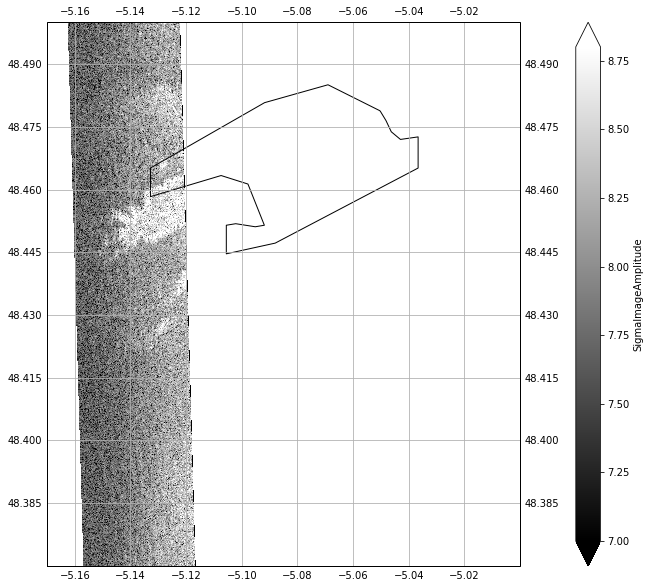

In [79]:
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(1,1,1, projection=ccrs.Mercator())
np.log10(dsm.SigmaImageAmplitude).plot(
                                 y='LatImage', x='LonImage',
                                 robust=True, 
                                 cmap='gist_gray',
                                 vmin=7, vmax=8.8,
                                       transform=ccrs.PlateCarree()
                                           )
ax.coastlines(resolution='10m')
gl=ax.gridlines(draw_labels=True)
ax.set_extent([-5.17, -5., 48.37, 48.5], crs=ccrs.PlateCarree())

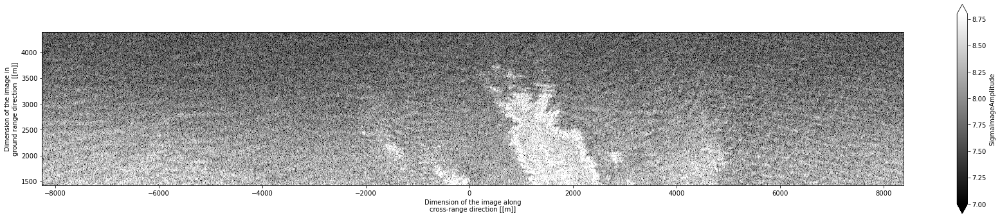

In [13]:
ax = np.log10(dsm.SigmaImageAmplitude).plot(figsize=(30, 6),
                                 y='GroundRange', x='CrossRange',
                                 robust=True, 
                                 cmap='gist_gray',
                                 vmin=7, vmax=8.8,
                                           ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

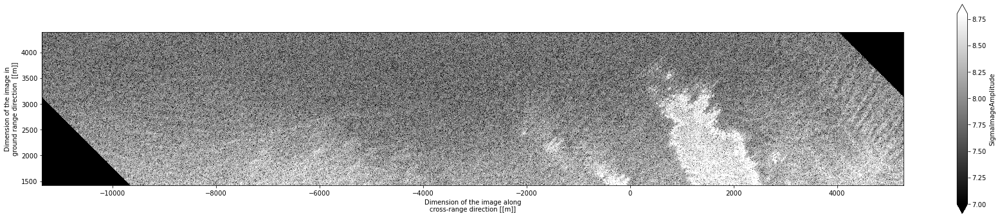

In [14]:
ax = np.log10(dsa.SigmaImageAmplitude).plot(figsize=(30, 6),
                                 y='GroundRange', x='CrossRange',
                                 robust=True, 
                                 cmap='gist_gray',
                                 vmin=7, vmax=8.8,
                                           ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

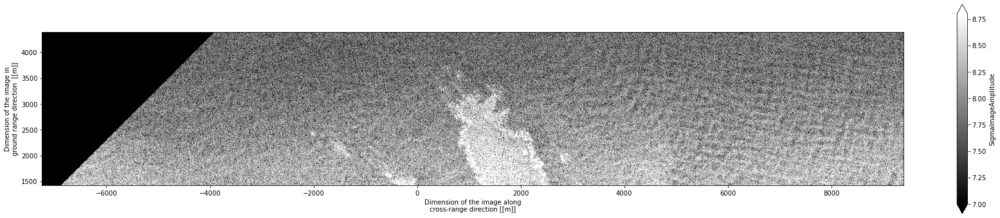

In [15]:
ax = np.log10(dsf.SigmaImageAmplitude).plot(figsize=(30, 6),
                                 y='GroundRange', x='CrossRange',
                                 robust=True, 
                                 cmap='gist_gray',
                                 vmin=7, vmax=8.8,
                                           ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

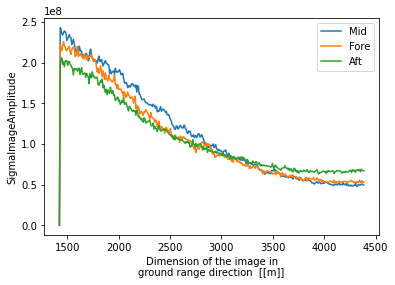

In [16]:
dsm.SigmaImageAmplitude.median(dim='CrossRange').plot(label='Mid')
dsf.SigmaImageAmplitude.median(dim='CrossRange').plot(label='Fore')
dsa.SigmaImageAmplitude.median(dim='CrossRange').plot(label='Aft')
# plt.ylim([0,500])
plt.legend()

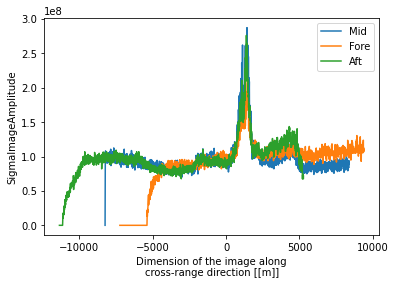

In [17]:
dsm.SigmaImageAmplitude.median(dim='GroundRange').plot(label='Mid')
dsf.SigmaImageAmplitude.median(dim='GroundRange').plot(label='Fore')
dsa.SigmaImageAmplitude.median(dim='GroundRange').plot(label='Aft')
# plt.ylim([0,500])
plt.legend()

# Coherence

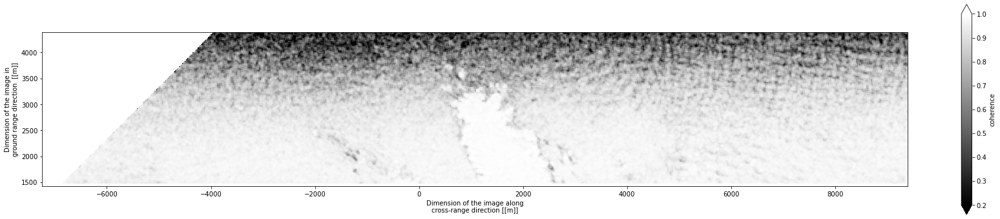

In [18]:
ax = dsf.coherence.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='gist_gray',
                        vmin=0.2, vmax=1,
                      ) 
                        #            
ax.axes.set_aspect('equal')

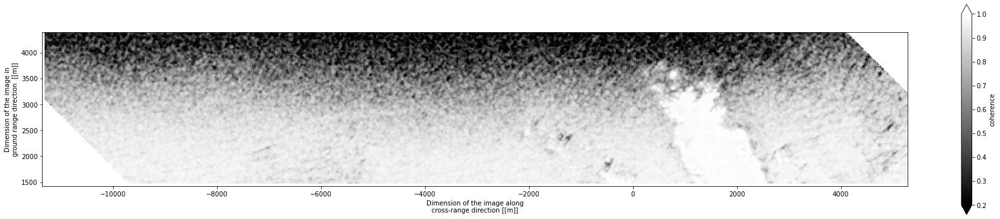

In [19]:
ax = dsa.coherence.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='gist_gray',
                        vmin=0.2, vmax=1,
                      ) 
                        # vmin=0.9, vmax=1,           
ax.axes.set_aspect('equal')

# Interferogram

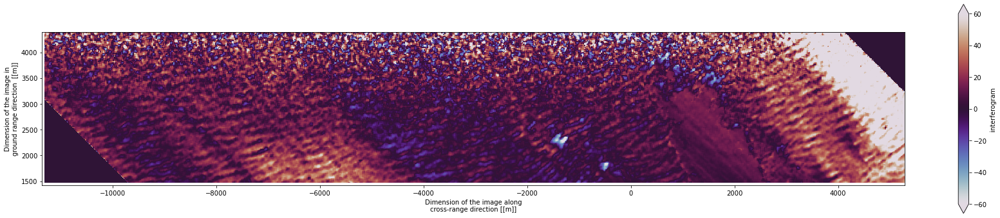

In [20]:
ax = dsa.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='twilight',
                        vmin=-60, vmax=60,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

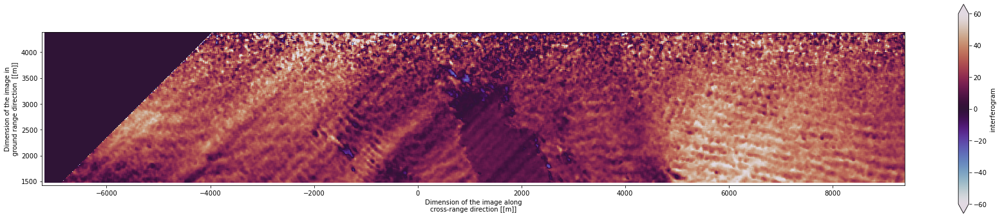

In [21]:
ax = dsf.interferogram.plot(figsize=(30, 6),
                        y='GroundRange', x='CrossRange',
                        robust=True, 
                        cmap='twilight',
                        vmin=-60, vmax=60,
                      ) #vmin=700, vmax=900,
ax.axes.set_aspect('equal')

In [22]:
data_vars_2D = [
    'SigmaImageSingleLookRealPart',
    'SigmaImageSingleLookImaginaryPart',
    'LatImage',                                
    'LonImage',                                
    'DEMImage',                                
    'OrbLatImage',                             
    'OrbLonImage',                             
    'OrbHeightImage',                          
    'OrbTimeImage',                            
    'OrbitImage',
    'SigmaImageSingleLookRealPartSlave',
    'SigmaImageSingleLookImaginaryPartSlave',
    'OrbLatImageSlave',
    'OrbLonImageSlave',
    'OrbHeightImageSlave',
    'OrbTimeImageSlave',
    'OrbitImageSlave',
]

In [23]:
data_vars_time = [
    'OrbitLatitude',
    'OrbitLongitude',
    'OrbitHeight',           
    'OrbitHeading',       
    'OrbitRoll',             
    'OrbitPitch',            
]

In [24]:
data_vars_pattern = [
    'TxElevationGain',
    'TxAzimuthGain',
    'RxElevationGain',
    'RxAzimuthGain',
    'TxElevationGainSlave',
    'TxAzimuthGainSlave',
    'RxElevationGainSlave',
    'RxAzimuthGainSlave',
]

/Users/admartin/opt/anaconda3/envs/seastar/lib/python3.7/site-packages/xarray/plot/utils.py:437: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(figsize=figsize)


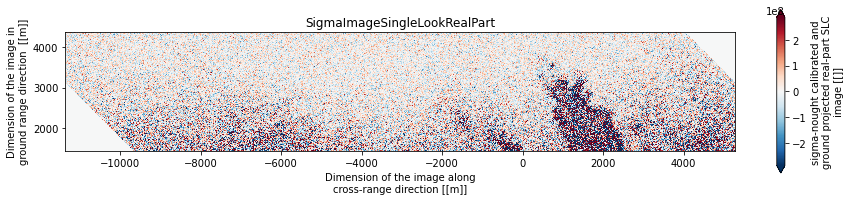

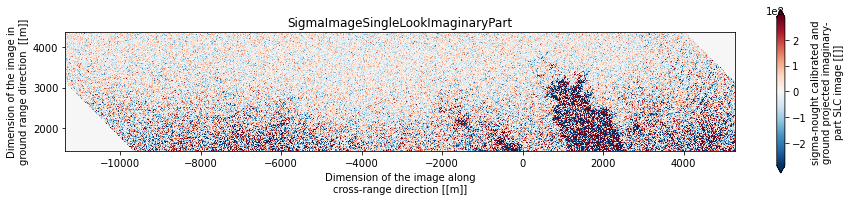

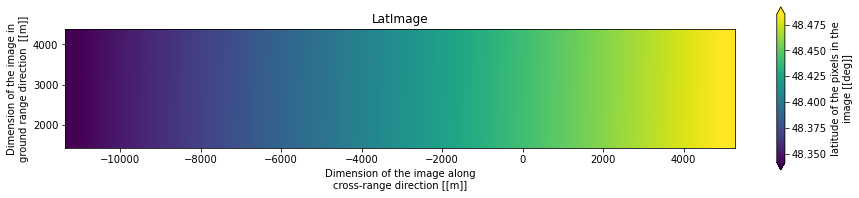

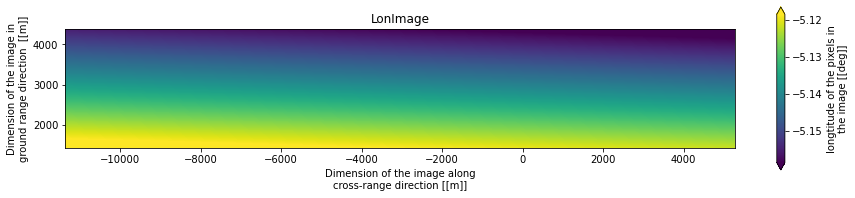

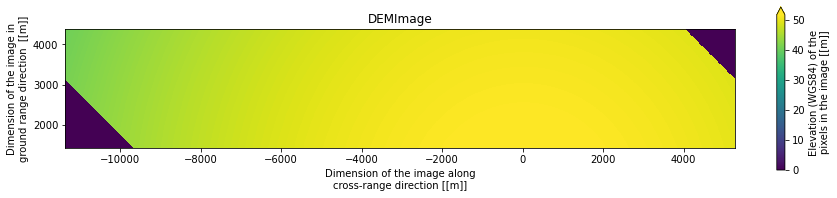

...

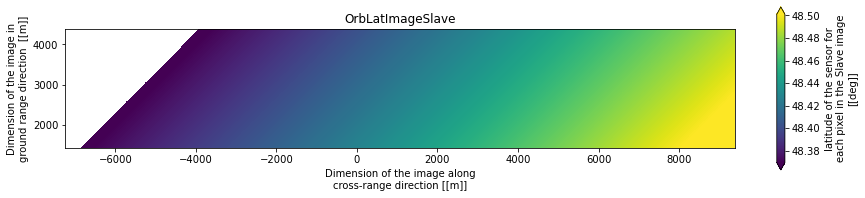

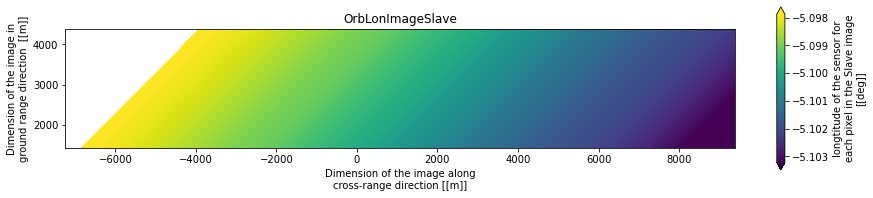

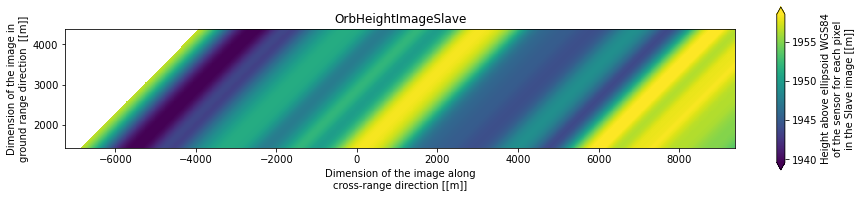

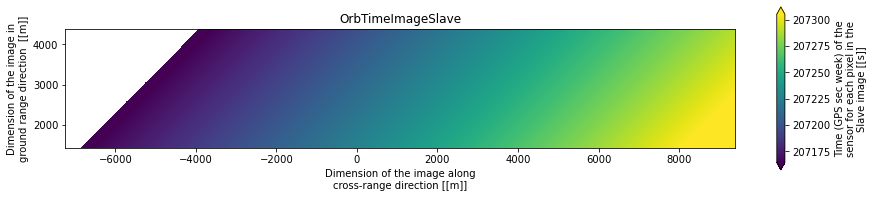

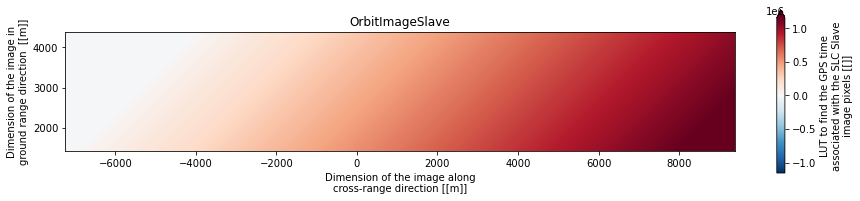

In [25]:
for ds in [dsa, dsf]:
    for var in data_vars_2D:
        ax = ds[var].plot(
                figsize=(15, 3),
                y='GroundRange', x='CrossRange',
                robust=True
                )
        ax.axes.set_aspect('equal')
        plt.title(var)

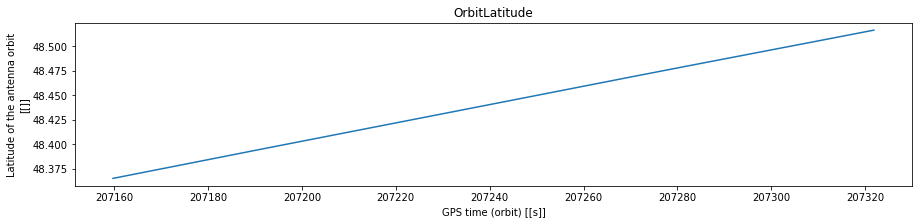

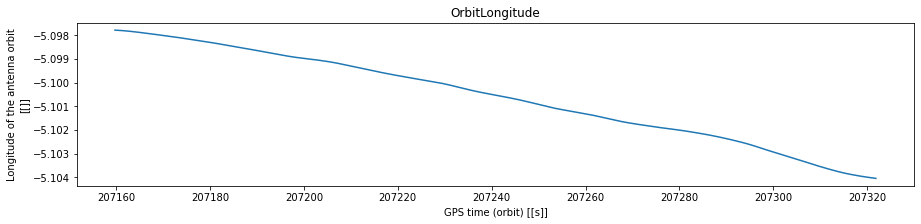

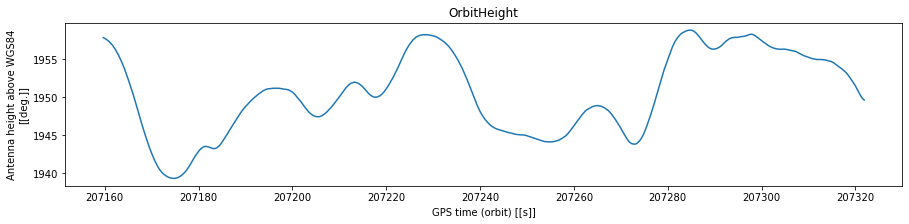

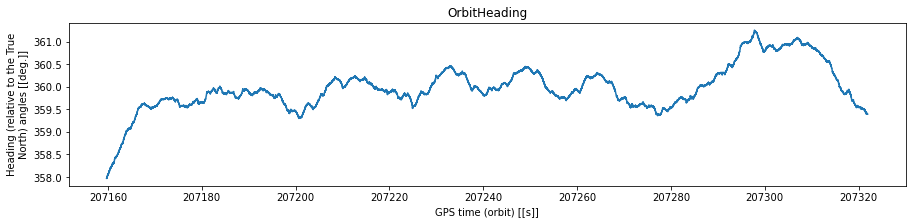

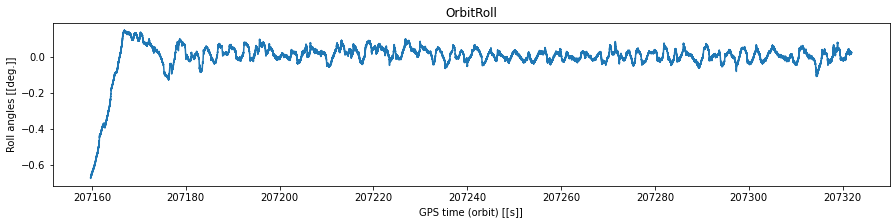

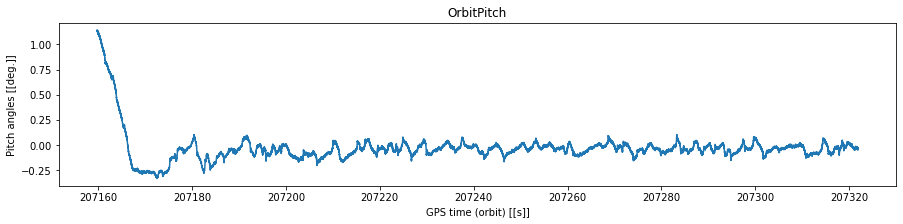

In [26]:
for var in data_vars_time:
    ax = ds[var].plot(
            figsize=(15, 3),
            )
#     ax.axes.set_aspect('equal')
    plt.title(var)

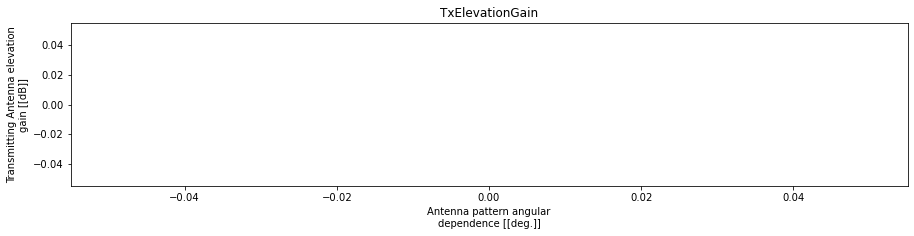

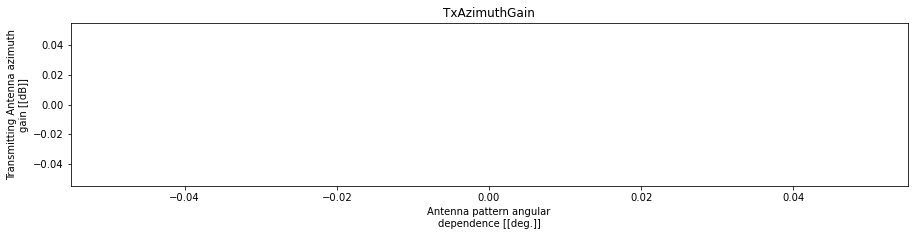

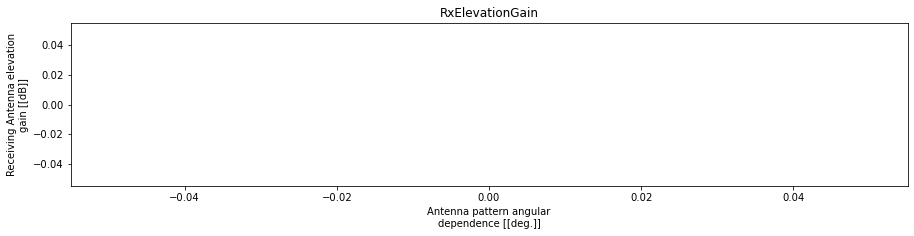

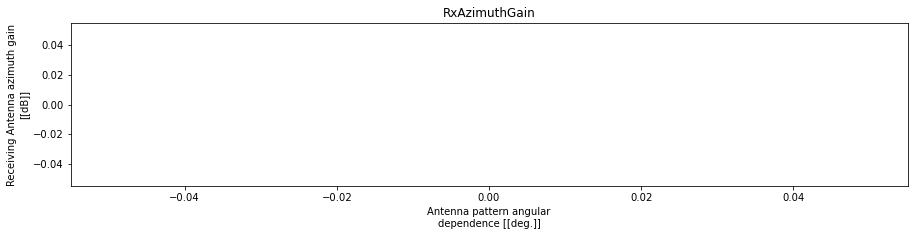

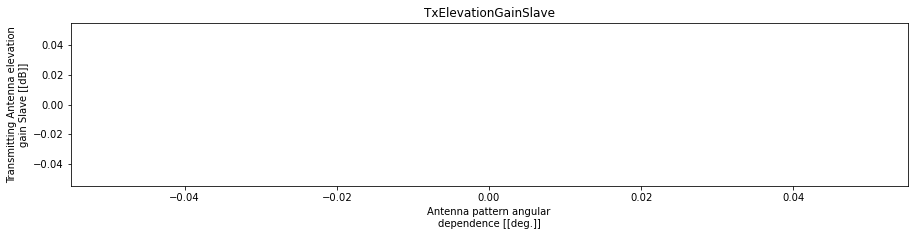

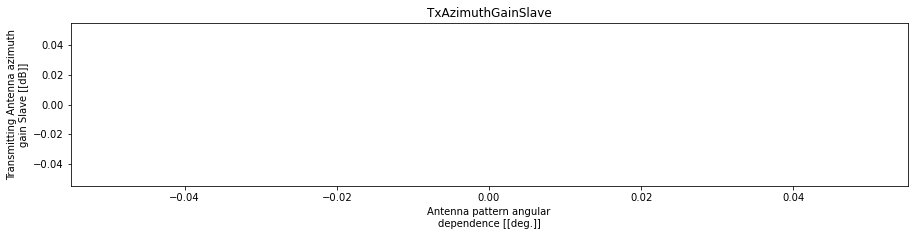

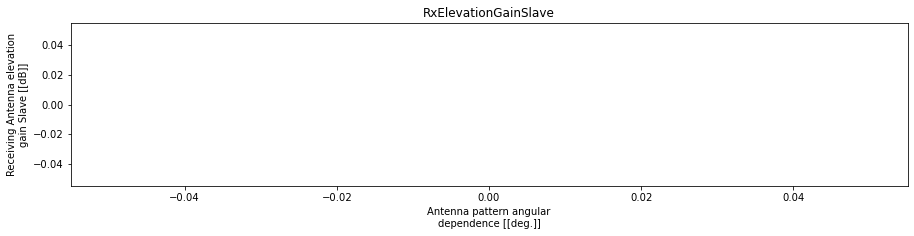

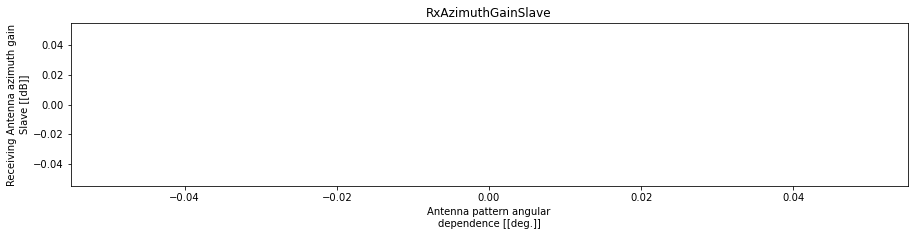

In [27]:
for var in data_vars_pattern:
    ax = ds[var].plot(
            figsize=(15, 3),
            )
#     ax.axes.set_aspect('equal')
    plt.title(var)

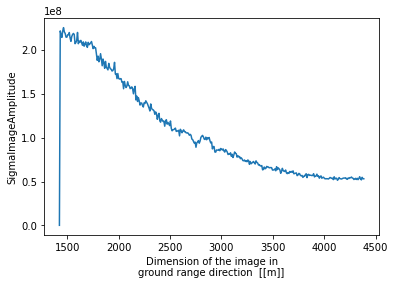

In [28]:
ds.SigmaImageAmplitude.median(dim='CrossRange').plot()

In [31]:
dsf.sel(CrossRange=2000).LatImage

<xarray.DataArray 'LatImage' (GroundRange: 371)>
array([48.458821, 48.458819, 48.458817, ..., 48.458058, 48.458056, 48.458054])
Coordinates:
  * GroundRange  (GroundRange) float32 1.424e+03 1.432e+03 ... 4.384e+03
    CrossRange   float32 2e+03
Attributes:
    long_name:  latitude of the pixels in the image
    units:      [deg]

In [33]:
dsa.sel(CrossRange=2000).LatImage

<xarray.DataArray 'LatImage' (GroundRange: 371)>
array([48.458821, 48.458819, 48.458817, ..., 48.458058, 48.458056, 48.458054])
Coordinates:
  * GroundRange  (GroundRange) float32 1.424e+03 1.432e+03 ... 4.384e+03
    CrossRange   float32 2e+03
Attributes:
    long_name:  latitude of the pixels in the image
    units:      [deg]

In [32]:
dsf.sel(CrossRange=2000).LonImage

<xarray.DataArray 'LonImage' (GroundRange: 371)>
array([-5.120541, -5.120649, -5.120757, ..., -5.160332, -5.16044 , -5.160549])
Coordinates:
  * GroundRange  (GroundRange) float32 1.424e+03 1.432e+03 ... 4.384e+03
    CrossRange   float32 2e+03
Attributes:
    long_name:  longtitude of the pixels in the image
    units:      [deg]

In [32]:
dsf.sel(CrossRange=2000).LonImage

<xarray.DataArray 'LonImage' (GroundRange: 371)>
array([-5.120541, -5.120649, -5.120757, ..., -5.160332, -5.16044 , -5.160549])
Coordinates:
  * GroundRange  (GroundRange) float32 1.424e+03 1.432e+03 ... 4.384e+03
    CrossRange   float32 2e+03
Attributes:
    long_name:  longtitude of the pixels in the image
    units:      [deg]

In [91]:
dsf.OrbTimeImage.isel(GroundRange=100, CrossRange=1000)

<xarray.DataArray 'OrbTimeImage' ()>
array(207226.674599)
Coordinates:
    GroundRange  float32 2224.0
    CrossRange   float32 760.0
Attributes:
    long_name:  Time (GPS sec week) of the sensor for each pixel in the image
    units:      [s]

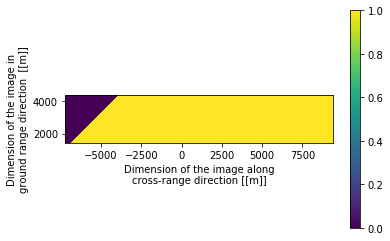

In [88]:
ax = (dsf.OrbTimeImage == dsf.OrbTimeImageSlave).plot(
                y='GroundRange', x='CrossRange',
                robust=True
                )
ax.axes.set_aspect('equal')

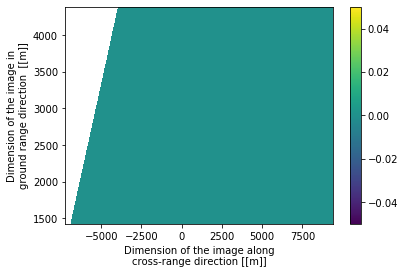

In [82]:
( dsf.OrbTimeImage - dsf.OrbTimeImageSlave ).plot(
            y='GroundRange', x='CrossRange',
                robust=True)